In [9]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 

In [10]:
cv2.__version__

'4.5.3'

https://opencv-python.readthedocs.io/en/latest/doc/01.imageStart/imageStart.html

`cv2.imread`(fileName, flag)
- fileName (str) – 이미지파일의 경로
- flag (int) – 이미지 파일을 읽을 때의 Option.

`cv2.IMREAD_COLOR` >>> flag = 1   
이미지 파일을 Color로 읽어들입니다. 투명한 부분은 무시되며, Default값

`cv2.IMREAD_GRAYSCALE` >>> flag = 0  
이미지를 Grayscale로 읽어 들입니다. 실제 이미지 처리시 중간단계로 많이 사용

`cv2.IMREAD_UNCHANGED` >>> flag = -1  
이미지파일을 alpha channel까지 포함하여 읽어 들입니다

-----
`cv2.imread('img.png', 0)`
이미지를 Grayscale로 읽어 들이겠다

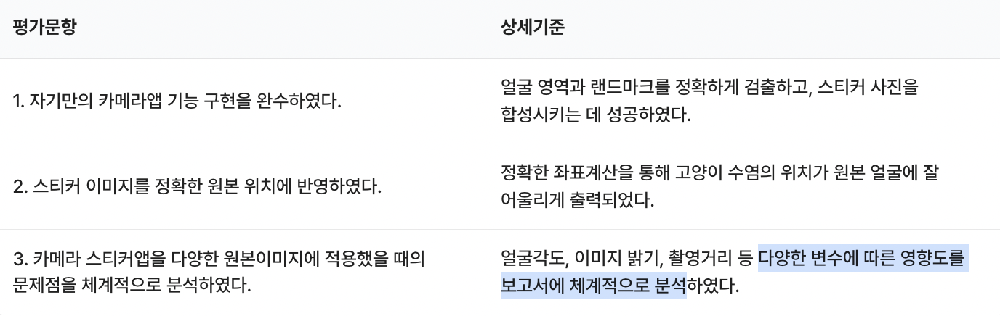

# 2-6. 프로젝트: 고양이 수염 스티커 만들기 
https://www.flaticon.com/free-icon/cat-whiskers_24674?term=cat%20nose&page=1&position=1

In [1]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 

### Step 1. 스티커 구하기 or 만들기
(1) 고양이 수염 이미지를 다운로드   
(2) 여러분의 셀카 이미지도 촬영  

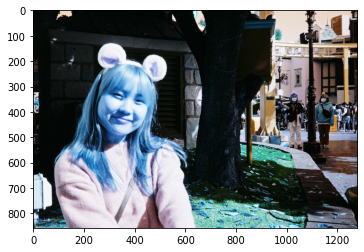

In [2]:
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/npc2.png' 
img_bgr = cv2.imread(image_path)

img_show = img_bgr.copy()

plt.imshow(img_bgr) 
plt.show() 

In [3]:
img_bgr.shape

(858, 1280, 3)

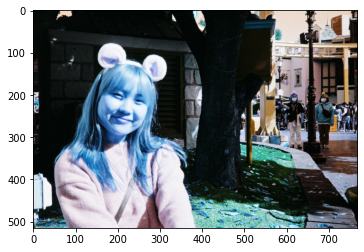

In [3]:
# shrink_img_bgr = cv2.resize(img_bgr, None, 
#                             fx=.6, fy=.6,  # 0.6배의 크기로 
#                             interpolation= cv2.INTER_AREA) # 보간법 사용으로 축소 및 확대 해도 픽셀 안깨지게
# plt.imshow(shrink_img_bgr);

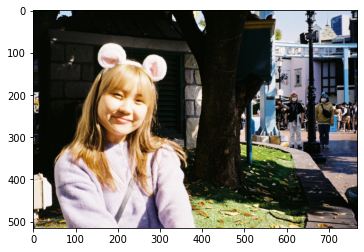

In [7]:
plt.imshow(cv2.cvtColor(shrink_img_bgr, cv2.COLOR_BGR2RGB));

In [4]:
# img_show = shrink_img_bgr.copy() # 최종 테스트용?!

# img_rgb = cv2.cvtColor(shrink_img_bgr, cv2.COLOR_BGR2RGB)

# img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

In [3]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

### Step 2. 얼굴 검출 & 랜드마크 검출 하기
`dlib`을 이용해서 얼굴의 `bounding box` 위치와 `landmark`의 위치를 찾아  
http://dlib.net/python/index.html#dlib_pybind11.get_frontal_face_detector

In [4]:
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
         # (image, num of image pyramid)

In [5]:
img_rgb.shape

(858, 1280, 3)

In [8]:
dlib_rects

rectangles[[(266, 266) (489, 489)]]

`cv2.rectangle`(img, __start, end__ , colour, thickness)  
thickness = -1 -> 채우기

In [5]:
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)

In [6]:
# img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

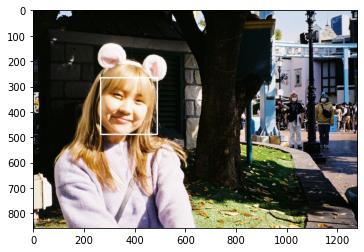

In [6]:
plt.imshow(img_show_rgb);

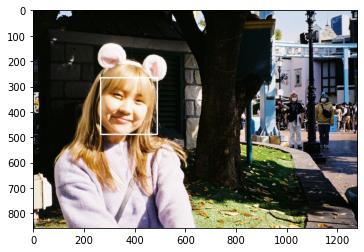

In [7]:
plt.imshow(img_show_rgb);

In [8]:
print(l, t, r, b, sep=", ")

266, 266, 489, 489


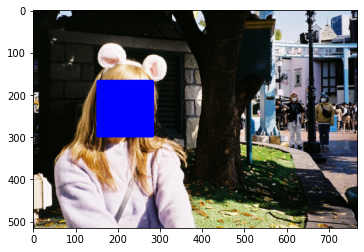

In [10]:
#plt.imshow(img_show_rgb);
#thickness = -1, color = (0, 0, 255)

In [6]:
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')

list <- map <- `points.parts().x`, `points.parts().y`

In [7]:
list_landmarks = []

for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)

In [17]:
len(list_landmarks)

1

In [18]:
len(list_landmarks[0])

68

`cv2.circle`(img, __center, radius__ , colour, thickness)

In [8]:
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)
# rgb로 하면 안되나?

In [12]:
# img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

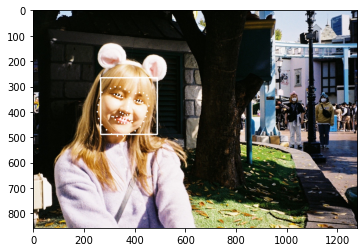

In [10]:
plt.imshow(img_show_rgb);

In [16]:
dlib_rects

rectangles[[(266, 266) (489, 489)]]

`circle`  
(img, center, radius, color[, thickness[, lineType[, shift]]]) 

In [9]:
cv2.circle(img_show_rgb, center= tuple((l, t)),
          radius=2, color=(255, 0, 0), thickness=5,
          lineType=cv2.LINE_AA) 

cv2.circle(img_show_rgb, center= tuple((r, b)),
          radius=2, color=(255, 0, 0), thickness=5,
          lineType=cv2.LINE_AA)

cv2.circle(img_show_rgb, center= tuple(landmark[30]),
          radius=2, color=(0, 0, 255), thickness=5,
          lineType=cv2.LINE_AA)

array([[[  4,   9,   3],
        [ 13,  18,  12],
        [ 12,  17,  11],
        ...,
        [142, 143, 161],
        [127, 130, 145],
        [146, 149, 164]],

       [[  1,   6,   0],
        [  2,   7,   1],
        [  4,   9,   3],
        ...,
        [ 73,  76,  93],
        [ 62,  65,  80],
        [ 54,  60,  74]],

       [[  6,  11,   5],
        [  2,   7,   1],
        [  3,   8,   2],
        ...,
        [  6,   9,  26],
        [  9,  15,  31],
        [  5,  12,  28]],

       ...,

       [[ 25,  24,  29],
        [ 18,  18,  20],
        [ 22,  22,  22],
        ...,
        [142, 129, 138],
        [145, 132, 139],
        [158, 145, 152]],

       [[ 25,  25,  27],
        [ 26,  26,  28],
        [ 24,  24,  24],
        ...,
        [134, 120, 133],
        [145, 132, 142],
        [158, 145, 155]],

       [[ 24,  24,  26],
        [ 25,  25,  25],
        [ 24,  24,  24],
        ...,
        [135, 121, 136],
        [147, 133, 146],
        [157, 143, 156]]

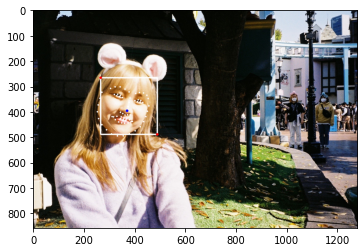

In [12]:
plt.imshow(img_show_rgb);

### Step 3. 스티커 적용 위치 확인하기

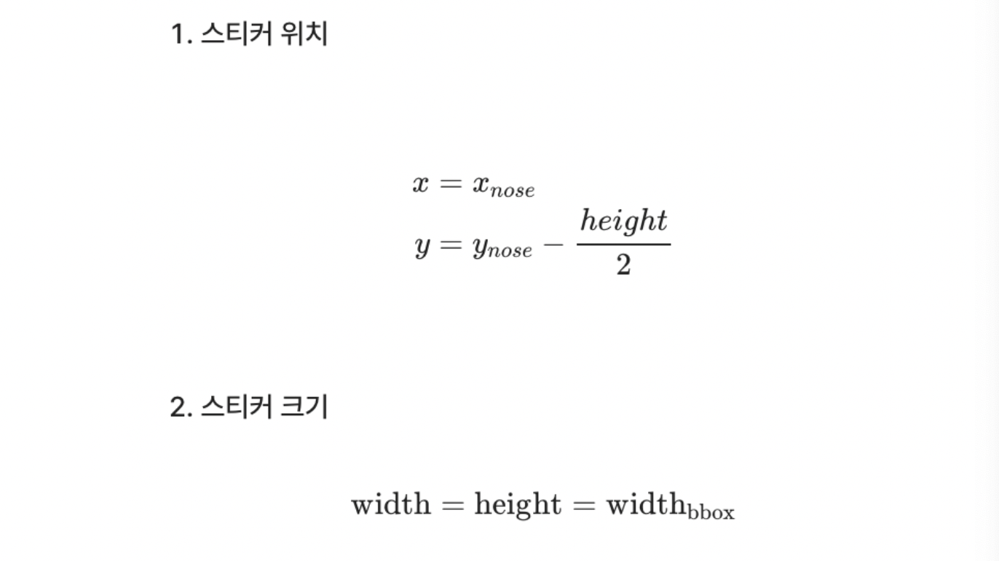

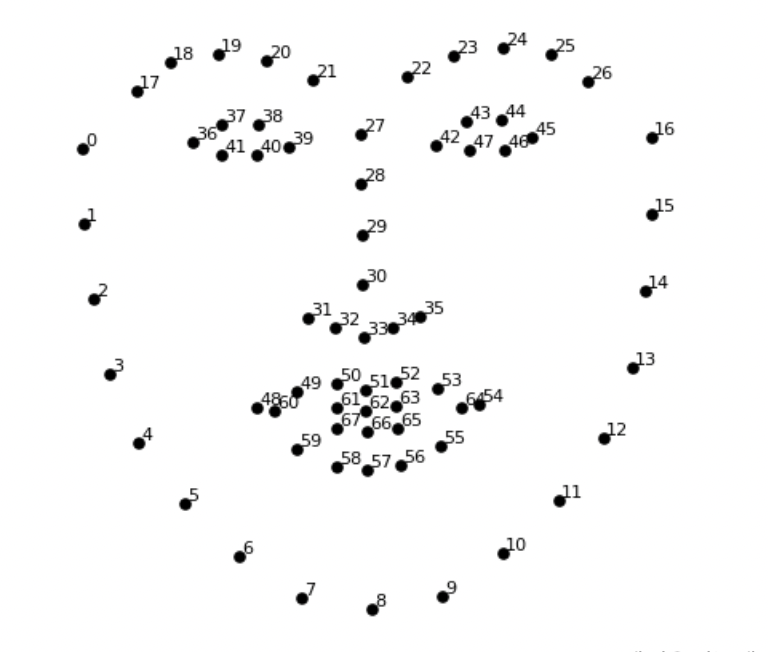

In [14]:
landmark[30]

(370, 396)

In [15]:
dlib_rect.height()
dlib_rect.width()

224

In [10]:
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()

In [12]:
print (f'(x, y) : ({x}, {y})')
print ('(w, h) : ({0}, {1})'.format(w, h))

(x, y) : (370, 396)
(w, h) : (224, 224)


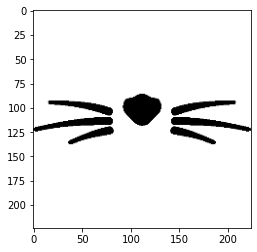

In [12]:
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h)) # 이미지에서 너무 벗어나면 w, h 조절
plt.imshow(img_sticker);

In [18]:
img_sticker.shape

(224, 224, 3)

In [19]:
dlib_rect

rectangle(266,266,489,489)

In [20]:
print(l, t, r, b, sep=", ")

266, 266, 489, 489


In [21]:
print(b - t, r - l)

223 223


In [22]:
print (f'(x, y) : ({x}, {y})')

(x, y) : (370, 396)


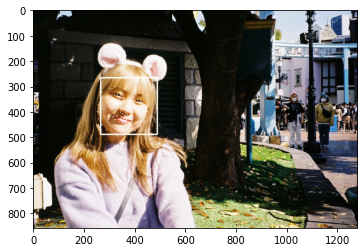

In [23]:
plt.imshow(img_show_rgb);

width, height 절반씩만 적용하면 코겠지? 아니 적용 안하면 되것네?  
고러면 landmark를 입에다가 설정할 필요 없을 거고

In [13]:
refined_x = x - (w // 2)
refined_y = y - (h // 2)
print (f'(x, y) : ({refined_x}, {refined_y})') 

(x, y) : (258, 284)


### Step 4. 스티커 적용하기
`np.where`를 사용해서 스티커를 적용  
opencv 의 `cv2.addWeighted()`  

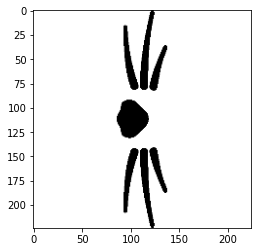

In [62]:
plt.imshow(cv2.rotate(img_sticker , cv2.ROTATE_90_COUNTERCLOCKWISE))

In [14]:
height, width = img_sticker.shape[:2]

https://webnautes.tistory.com/1250

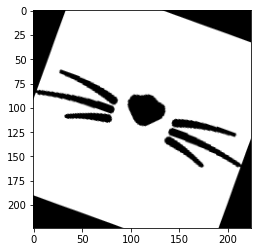

In [15]:
M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
                            angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
                            scale = 1) # 이미지 배율
img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height))

plt.imshow(img_sticker_rotation);

added_image = cv2.addWeighted(img_show,0.5,
                              img_sticker_rotation,0.5,0)

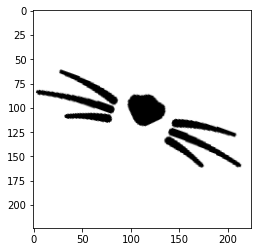

In [36]:
M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
                            angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
                            scale = 1) # 이미지 배율
img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height),
                                     borderValue = [255, 255, 255, 255])
                                     #,borderMode = cv2.BORDER_TRANSPARENT)



plt.imshow(img_sticker_rotation);

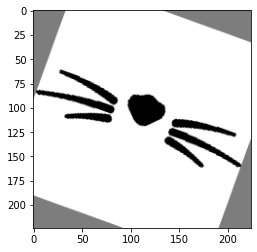

In [38]:
M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
                            angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
                            scale = 1) # 이미지 배율
img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height),
                                     borderValue = [125, 125, 125, 125])

plt.imshow(img_sticker_rotation);

In [35]:
img_show.shape

(515, 768, 3)

In [16]:
if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
    
print (f'(x, y) : ({refined_x},{refined_y})')

(x, y) : (258,284)


In [18]:
sticker_area.shape

(130, 130, 3)

In [17]:
img_sticker_rotation.shape

(130, 130, 4)

### img_show

In [18]:
sticker_area = img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]
img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(sticker_area, 0.9, 
                    np.where(img_sticker_rotation==255, sticker_area, img_sticker_rotation).astype(np.uint8),
                    0.1, 0)

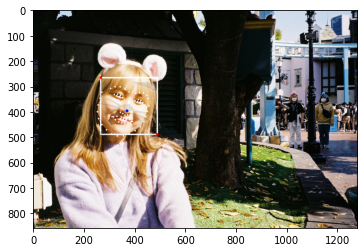

In [19]:
plt.imshow(img_show_rgb);

In [17]:
sticker_area = img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                        refined_x : refined_x + img_sticker_rotation.shape[1]]

# add = cv2.addWeighted(scr1 = sticker_area, alpha = 0.5, 
#                       scr2 = img_sticker_rotation, beta = 0.3, 
#                       0)

img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
         refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    np.where(img_sticker==255 ,sticker_area, img_sticker_rotation).astype(np.uint8)

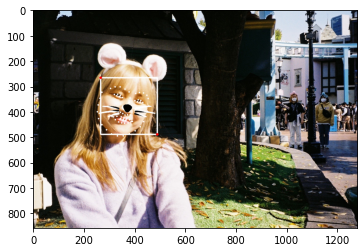

In [18]:
plt.imshow(img_show_rgb);

addWeighted 가 없으면 회전된 이미지가 적용이 안된다.

In [20]:
sticker_area = img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]
img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(sticker_area, 0.9, 
                    np.where(img_sticker_rotation==255, sticker_area, img_sticker_rotation).astype(np.uint8),
                    0.1, 0)

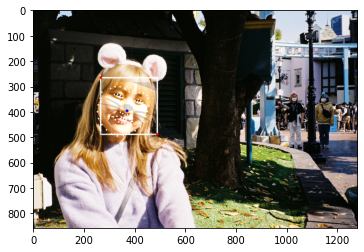

In [21]:
plt.imshow(img_show_rgb);

sticker_area = img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                        refined_x : refined_x + img_sticker_rotation.shape[1]]

add = cv2.addWeighted(sticker_area, 0.5, 
                      img_sticker_rotation, 0.3, 0)

img_show_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
         refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    np.where(img_sticker_rotation==0 , sticker_area, img_sticker_rotation).astype(np.uint8)

`cv2.imread(sticker_path, -1)` 
> 여기서 -1 값(alpha 넣을라구) 에러가 난 거 같다...  
>> 아니다 맞다 확실하다     

_ValueError: operands could not be broadcast together with shapes (130,130,4) (130,130,3) (130,130,4)_ 
> jpg & png 겹치는 작업이라서 충돌이 발생한 것 같다.  __두목 효린__
>> png로 해도 나는 왜 똑같지... ㅠㅠ (눈물)

b_channel, g_channel, r_channel = cv2.split(img_bgr)

alpha_channel = np.ones(b_channel.shape, dtype=b_channel.dtype) * 50 #creating a dummy alpha channel image.

img_bgr = cv2.merge((b_channel, g_channel, r_channel, alpha_channel))

## img_bgr

### cv2.addWeighted(sticker_area
> np.where(img_sticker_rotation==0

In [20]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(sticker_area, 0.9, 
                    np.where(img_sticker_rotation==0, sticker_area, img_sticker_rotation).astype(np.uint8),
                    0.1, 0)

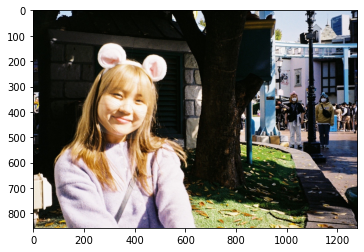

In [21]:
plt.imshow(img_rgb);

### cv2.addWeighted(img_sticker_rotation
> np.where(img_sticker_rotation==0

In [18]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(img_sticker_rotation, 0.9, 
                    np.where(img_sticker_rotation==0, sticker_area, img_sticker_rotation).astype(np.uint8),
                    0.1, 0)

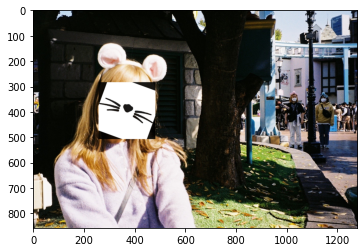

In [19]:
plt.imshow(img_rgb);

## 각각의 파라미터 설정 성공...

`cv2.addWeighted`
(src1, alpha, src2, beta, gamma[, dst[, dtype]])

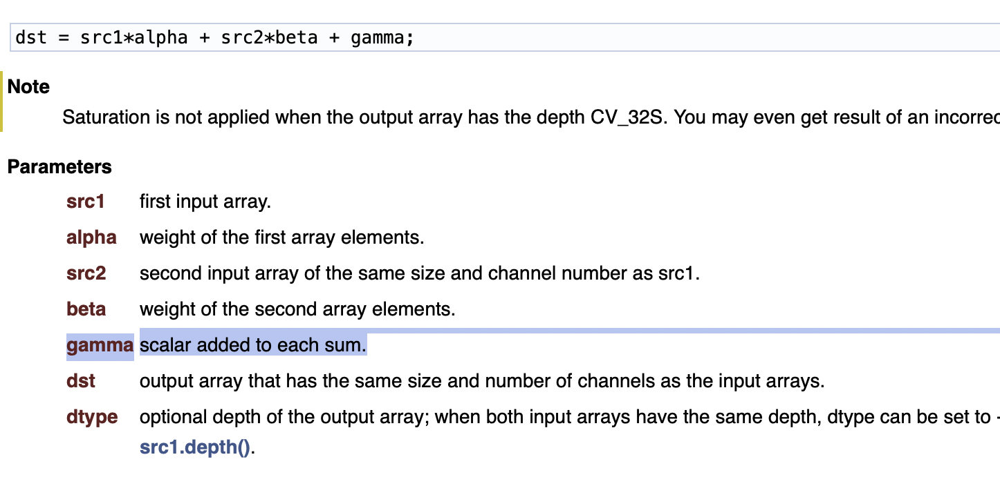
https://docs.opencv.org/4.x/d2/de8/group__core__array.html#gafafb2513349db3bcff51f54ee5592a19

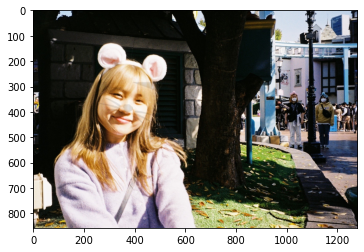

In [17]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(src1 = sticker_area, alpha = 0.9, 
                    src2 = np.where(img_sticker_rotation==255, sticker_area, img_sticker_rotation).astype(np.uint8),
                    beta = 0.1, gamma = 0)
plt.imshow(img_rgb);

### cv2.addWeighted(sticker_area
> np.where(img_sticker_rotation==255

In [22]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(sticker_area, alpha = 0.9, 
                    np.where(img_sticker_rotation==255, sticker_area, img_sticker_rotation).astype(np.uint8),
                    beta = 0.1, 0)

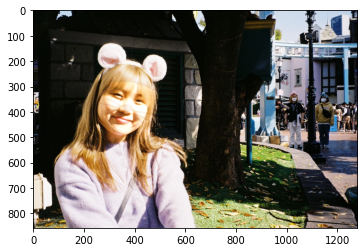

In [23]:
plt.imshow(img_rgb);

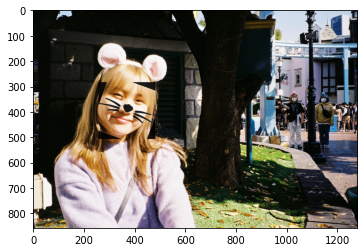

In [18]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(sticker_area, 0.1, 
                    np.where(img_sticker_rotation==255, sticker_area, img_sticker_rotation).astype(np.uint8),
                    0.9, 0)
plt.imshow(img_rgb);

### addWeight 없는 버전  &  회전 X 
>np.where(img_sticker==255

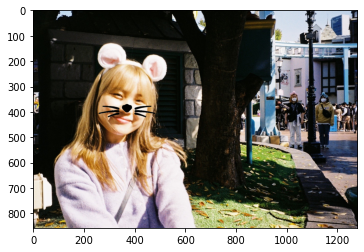

In [15]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker.shape[0], 
                        refined_x : refined_x + img_sticker.shape[1]]

img_rgb[refined_y : refined_y + img_sticker.shape[0], 
         refined_x : refined_x + img_sticker.shape[1]] = \
    np.where(img_sticker==255 ,sticker_area, img_sticker).astype(np.uint8)
plt.imshow(img_rgb);

### addWeight 없는 버전  &  회전 X
> np.where(img_sticker==0

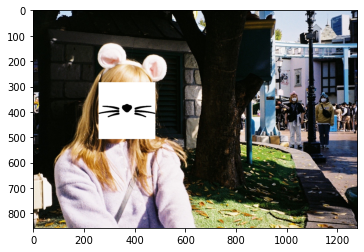

In [16]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker.shape[0], 
                        refined_x : refined_x + img_sticker.shape[1]]

img_rgb[refined_y : refined_y + img_sticker.shape[0], 
         refined_x : refined_x + img_sticker.shape[1]] = \
    np.where(img_sticker==0 ,sticker_area, img_sticker).astype(np.uint8)
plt.imshow(img_rgb);

### addWeight 없는 버전  &  회전 O
> np.where(img_sticker==0

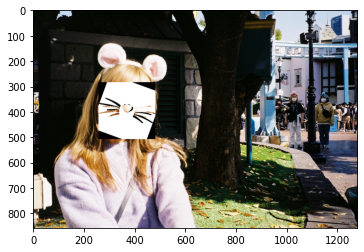

In [17]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                        refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
         refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    np.where(img_sticker==0 ,sticker_area, img_sticker_rotation).astype(np.uint8)

plt.imshow(img_rgb);

### addWeight 없는 버전  &  회전 O
>np.where(img_sticker_rotation==255

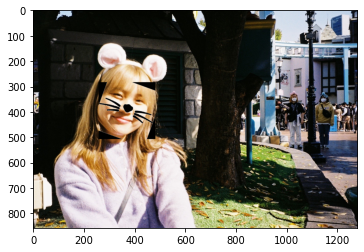

In [17]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                        refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
         refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    np.where(img_sticker_rotation==255 ,sticker_area, img_sticker_rotation).astype(np.uint8)

plt.imshow(img_rgb);

### addWeight 없는 버전  &  회전 O
> np.where(img_sticker_rotation==0

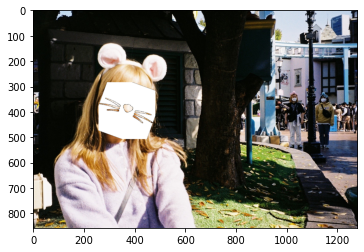

In [17]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                        refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
         refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    np.where(img_sticker_rotation==0 ,sticker_area, img_sticker_rotation).astype(np.uint8)

plt.imshow(img_rgb);

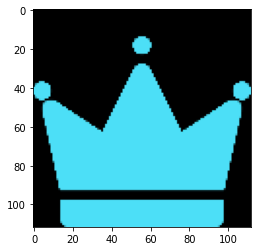

In [16]:
# plt.imshow(king_sticker)

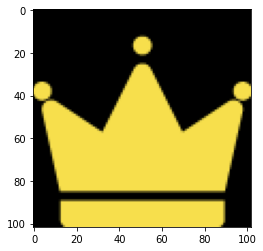

In [16]:
# cv2.cvtColor(king_sticker, cv2.COLOR_BGR2RGB)
# plt.imshow(king_sticker)

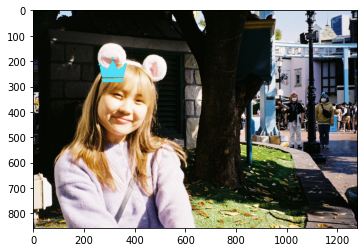

In [11]:
king_sticker = cv2.imread(os.getenv('HOME')+'/aiffel/camera_sticker/images/king.png') # image객체 행렬을 반환
king_sticker = cv2.resize(king_sticker, (w // 2, h // 2)) # (image 행렬, w가로 h세로 ) 픽셀의 수(187)
###
ref_x = x - (w // 2)
ref_y = y - h
###
if ref_x < 0: 
    king_sticker = king_sticker[:, -ref_x:]
    ref_x = 0
#
if ref_y < 0: 
    king_sticker = king_sticker[-ref_y:, :]
    ref_y = 0
###
king_area = img_rgb[ref_y : ref_y + king_sticker.shape[0], 
                        ref_x : ref_x + king_sticker.shape[1]]
#
img_rgb[ref_y : ref_y + king_sticker.shape[0], 
         ref_x : ref_x + king_sticker.shape[1]] = \
    np.where(king_sticker==0 , king_area, king_sticker).astype(np.uint8)    
###
plt.imshow(img_rgb);

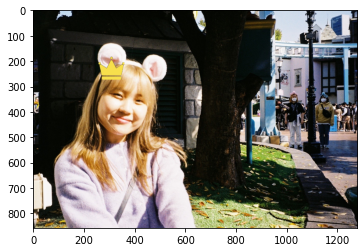

In [11]:
king_sticker = cv2.imread(os.getenv('HOME')+'/aiffel/camera_sticker/images/king.png') # image객체 행렬을 반환
king_sticker = cv2.resize(king_sticker, None, 
               fx=.2, fy=.2,  # 0.2배의 크기로 
               interpolation= cv2.INTER_AREA)
king_sticker = cv2.cvtColor(king_sticker, cv2.COLOR_BGR2RGB)
###
ref_x = x - (w // 2)
ref_y = y - h
###
if ref_x < 0: 
    king_sticker = king_sticker[:, -ref_x:]
    ref_x = 0
#
if ref_y < 0: 
    king_sticker = king_sticker[-ref_y:, :]
    ref_y = 0
###
king_area = img_rgb[ref_y : ref_y + king_sticker.shape[0], 
                        ref_x : ref_x + king_sticker.shape[1]]
#
img_rgb[ref_y : ref_y + king_sticker.shape[0], 
         ref_x : ref_x + king_sticker.shape[1]] = \
    np.where(king_sticker==0 , king_area, king_sticker).astype(np.uint8)    
###
plt.imshow(img_rgb);

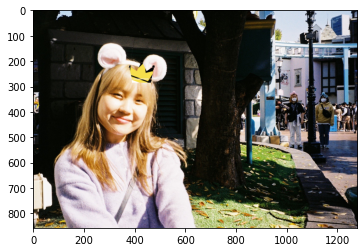

In [2]:
#x = landmark[54][0]
king_sticker = cv2.imread(os.getenv('HOME')+'/aiffel/camera_sticker/images/king.png') # image객체 행렬을 반환
king_sticker = cv2.resize(king_sticker, None, 
               fx=.2, fy=.2,  # 0.2배의 크기로 
               interpolation= cv2.INTER_AREA)
king_sticker = cv2.cvtColor(king_sticker, cv2.COLOR_BGR2RGB)
###
ref_x = x - (w // 2) + 100
ref_y = y - h - 30
###

height, width = king_sticker.shape[:2]
####
M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
                            angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
                            scale = 1) # 이미지 배율
king_sticker_rotation = cv2.warpAffine(king_sticker, M, (width, height), borderValue = [255, 255, 255, 255])


# if ref_x < 0: 
#     king_sticker = king_sticker[:, -ref_x:]
#     ref_x = 0
#
if ref_y < 0: 
    king_sticker_rotation = king_sticker_rotation[-ref_y:, :]
    ref_y = 0
###
king_area = img_rgb[ref_y : ref_y + king_sticker_rotation.shape[0], 
                        ref_x : ref_x + king_sticker_rotation.shape[1]]
#
img_rgb[ref_y : ref_y + king_sticker_rotation.shape[0], 
         ref_x : ref_x + king_sticker_rotation.shape[1]] = \
    np.where(king_sticker==0 , king_area, king_sticker_rotation).astype(np.uint8)    
###
plt.imshow(img_rgb);

----
----
----
# 최최최최최최최최종

# 회전 + 투명도 조절 
`cv2.warpAffine(borderValue = [255, 255, 255, 255])` or  
`cv2.warpAffine(borderMode= cv2.BORDER_TRANSPARENT)`

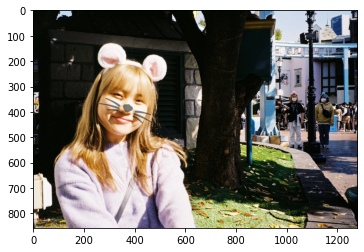

In [40]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(src1= sticker_area, alpha = .5, 
                    src2 = np.where(img_sticker_rotation == 255, sticker_area, img_sticker_rotation).astype(np.uint8), 
                    beta = 0.5, gamma = 0)
plt.imshow(img_rgb);

# 회전

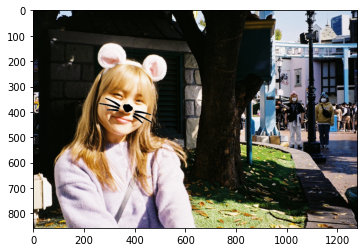

In [43]:
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
        np.where(img_sticker_rotation == 255, sticker_area, img_sticker_rotation).astype(np.uint8)                     

plt.imshow(img_rgb);

------
------
------
# 번외

In [4]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 
####
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/nagi.png' 
img_bgr = cv2.imread(image_path)
####
img_show = img_bgr.copy()
####
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
####
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
####
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽
#
    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)

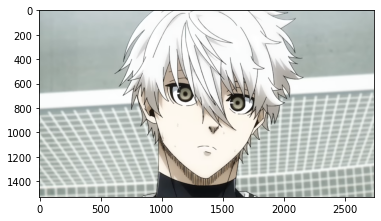

In [5]:
plt.imshow(img_rgb)

In [10]:
dlib_rects

rectangles[]

In [6]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)

In [9]:
list_landmarks

[]

In [3]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)
####
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()
####
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path, 1) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h))

####
refined_x = x - (w // 2)
refined_y = y - (h // 2)
####
# height, width = img_sticker.shape[:2]
# ####
# M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
#                             angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
#                             scale = 1) # 이미지 배율
# img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height), borderValue = [255, 255, 255, 255])

if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
####
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
    cv2.addWeighted(src1= sticker_area, alpha = .5, 
                    src2 = np.where(img_sticker_rotation == 255, sticker_area, img_sticker_rotation).astype(np.uint8), 
                    beta = 0.5, gamma = 0)
plt.imshow(img_rgb);

NameError: name 'landmark' is not defined

### 그림은 인식 못한다유..
----

In [11]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 
####
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/young1.png' 
img_bgr = cv2.imread(image_path)
####
img_show = img_bgr.copy()
####
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
####
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
####
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽
#
    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)

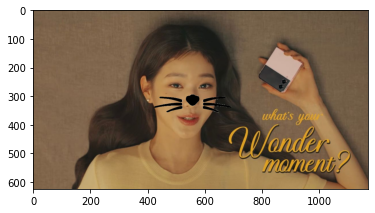

In [14]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)
####
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()
####
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path, 1) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h))

####
refined_x = x - (w // 2)
refined_y = y - (h // 2)
####
# height, width = img_sticker.shape[:2]
# ####
# M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
#                             angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
#                             scale = 1) # 이미지 배율
# img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height), borderValue = [255, 255, 255, 255])

if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
####
sticker_area = img_rgb[refined_y : refined_y + img_sticker.shape[0], 
                            refined_x : refined_x + img_sticker.shape[1]]

img_rgb[refined_y : refined_y + img_sticker.shape[0], 
        refined_x : refined_x + img_sticker.shape[1]] = \
        np.where(img_sticker == 255, sticker_area, img_sticker).astype(np.uint8) 
                    
plt.imshow(img_rgb);

In [27]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 
####
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/young2.png' 
img_bgr = cv2.imread(image_path)
####
img_show = img_bgr.copy()
####
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
####
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
####
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽
#
    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)

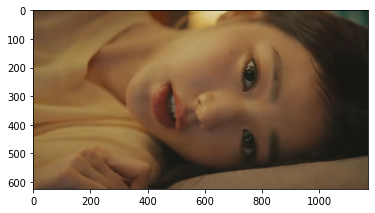

In [28]:
plt.imshow(img_show_rgb);

In [26]:
# 누워서 사각형 못 만드네..
dlib_rects

rectangles[]

In [31]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 10, (255, 255, 255), -1)

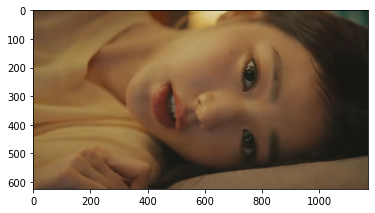

In [32]:
plt.imshow(img_show_rgb)

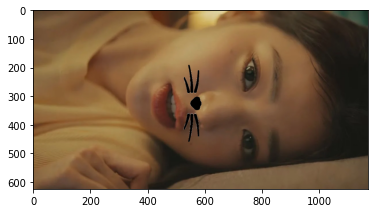

In [24]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)
####
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()
####
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path, 1) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h))

img_sticker = cv2.rotate(img_sticker , cv2.ROTATE_90_CLOCKWISE)


####
refined_x = x - (w // 2)
refined_y = y - (h // 2)
####
# height, width = img_sticker.shape[:2]
# ####
# M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
#                             angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
#                             scale = 1) # 이미지 배율
# img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height), borderValue = [255, 255, 255, 255])

if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
####
sticker_area = img_rgb[refined_y : refined_y + img_sticker.shape[0], 
                            refined_x : refined_x + img_sticker.shape[1]]

img_rgb[refined_y : refined_y + img_sticker.shape[0], 
        refined_x : refined_x + img_sticker.shape[1]] = \
        np.where(img_sticker == 255, sticker_area, img_sticker).astype(np.uint8) 
                    
plt.imshow(img_rgb);

In [39]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 
####
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/young2.png' 
img_bgr = cv2.imread(image_path)

img_bgr = cv2.rotate(img_bgr , cv2.ROTATE_90_COUNTERCLOCKWISE)

####
img_show = img_bgr.copy()
####
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
####
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
####
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽
#
    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)

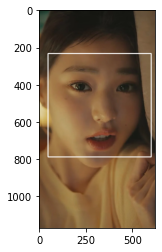

In [34]:
plt.imshow(img_show_rgb)

In [40]:
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 10, (255, 255, 255), -1)

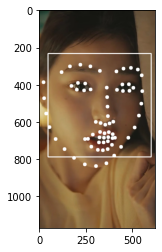

In [36]:
plt.imshow(img_show_rgb)

In [42]:
####
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()
####
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path, 1) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h))


####
refined_x = x - (w // 2)
refined_y = y - (h // 2)
####
# height, width = img_sticker.shape[:2]
# ####
# M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
#                             angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
#                             scale = 1) # 이미지 배율
# img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height), borderValue = [255, 255, 255, 255])

if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
####
sticker_area = img_rgb[refined_y : refined_y + img_sticker.shape[0], 
                            refined_x : refined_x + img_sticker.shape[1]]

img_rgb[refined_y : refined_y + img_sticker.shape[0], 
        refined_x : refined_x + img_sticker.shape[1]] = \
        np.where(img_sticker == 255, sticker_area, img_sticker).astype(np.uint8)
                    
plt.imshow(img_rgb);

ValueError: operands could not be broadcast together with shapes (556,556,3) (556,532,3) (556,556,3) 

In [43]:
import os 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
import dlib 
####
image_path = os.getenv("HOME") + '/aiffel/camera_sticker/images/young3.png' 
img_bgr = cv2.imread(image_path)
####
img_show = img_bgr.copy()
####
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
####
detector = dlib.get_frontal_face_detector()
dlib_rects = detector(img_rgb, 1)
####
for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽
#
    cv2.rectangle(img_show_rgb,  # img_show
                  pt1 = (l,t), pt2 = (r,b), 
                  color = (255, 255, 255), 
                  thickness = 3, 
                  lineType=cv2.LINE_AA)
####
landmark_predictor = dlib.shape_predictor(os.getenv("HOME") + '/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
#
list_landmarks = []
#
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect) # 모든 landmark의 위치정보
    list_points = list(map(lambda L: (L.x, L.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환
    list_landmarks.append(list_points)
####
for landmark in list_landmarks: # double list -> a list
    for point in landmark: # a list -> tuple
        cv2.circle(img_show_rgb, point, 3, (255, 255, 255), -1)

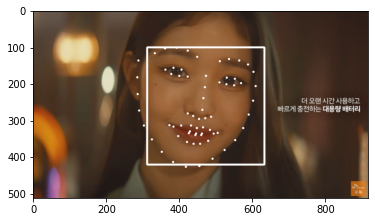

In [44]:
plt.imshow(img_show_rgb)

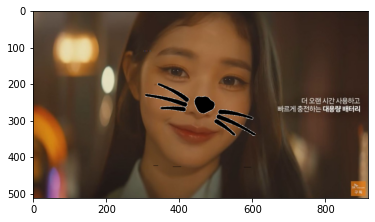

In [45]:
####
x = landmark[30][0] # 이미지에서 코 부위의 x값
y = landmark[30][1] # - dlib_rect.height() // 2 
w = h = dlib_rect.height()
####
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat.png'
img_sticker = cv2.imread(sticker_path, 1) # -1 해서 문제였나
img_sticker = cv2.resize(img_sticker, (w, h))

####
refined_x = x - (w // 2)
refined_y = y - (h // 2)
####
height, width = img_sticker.shape[:2]
# ####
M = cv2.getRotationMatrix2D(center = (width/2.0, height/2.0), #회전 중심
                            angle = -20, # 회전각도(양수 반시계방향, 음수 시계방향)
                            scale = 1) # 이미지 배율
img_sticker_rotation = cv2.warpAffine(img_sticker, M, (width, height),
                                     borderMode = cv2.BORDER_TRANSPARENT)


if refined_y < 0: 
    img_sticker = img_sticker[-refined_y:, :] 
    refined_y = 0
####
sticker_area = img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
                            refined_x : refined_x + img_sticker_rotation.shape[1]]

img_rgb[refined_y : refined_y + img_sticker_rotation.shape[0], 
        refined_x : refined_x + img_sticker_rotation.shape[1]] = \
        np.where(img_sticker_rotation == 255, sticker_area, img_sticker_rotation).astype(np.uint8) 
                    
plt.imshow(img_rgb);

### Step 5. 문제점 찾아보기
__1. 얼굴 각도에 따라 스티커가 어떻게 변해야할까요?__  
얼굴 각도가 움직인 만큼 스티커의 회전이 필요할 듯  


__2. 멀리서 촬영하면 왜 안될까요? 옆으로 누워서 촬영하면 왜 안될까요?__  
사각형 및 68개의 지점을 인식 잘 못할 듯..  
BBox도 파악하기 어려울듯...  
그러면 이제부터 본격적으로 게임을 시작할 수 있죠. pre-train 모델을 본인이 직접 ㅎ  


__3. 실행 속도가 중요할까요?`cv2.waitKey(0)`__  
그러게... 중요하나? 영상일 때 중요할 듯...  


__4. 스티커앱을 만들 때 정확도가 얼마나 중요할까요?__  
그래야 소비자들에게 공개를 해도 부끄럽지 않다. 노력한 결과물에 대해 악성 댓글이 덜 달린다.   

# 회고

1. `cv2.imread`를 통해 메인 이미지를 불러오니 BGR의 형태의 이미지이기에  
matplotlib를 통해서 image show를 하고 싶으면 RGB 형태를 변형 하기 위해  
`cv2.cvtColor`(img_show, cv2.COLOR_BGR2RGB) 사용합니당~  


2. `dlib.get_frontal_face_detector()`를 통해서 얼굴 위치를 찾고 BBox를 만들어욧!


3. `dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')` 를 통해서 학습된 모델을 불러와서 얼굴의 핵심 포인트를 68개의 좌표로 표시 가능하게 된다유!


4. 메인 이미지에 붙여 볼 스티커를 데려와욥
> `cv2.imread`


5. 붙일 스티커를 회전을 줄까 말까? 밀당 해봅니답
> `cv2.getRotationMatrix2D` 그리고 `cv2.warpAffine`


6. 어느 곳에 붙일까?를 고민해봐유  


7. `cv2.addWeighted`를 통해서 스티커의 투명도를 설정하여 잘난 척도 해보지요  


이러한 과정 및 경험을 통해  
절대 경로의 위대함 그리고 cv2와 matplotlib의 이미지 색상을 인식하는 방식이 다름을 알게 되었습니다.  

무엇보다도 이미지는 맑고 깨끗 그리고 뚜렷한 이미지 일수록  
얼굴 각도도 90도 단위라면  
쉽게 해결했을 프로젝트 였다.  
스티커를 회전 시키고 적용시켜보니 배경이 거슬리고  
투명도를 신경쓰려니 에러가 발생하고...  
하... 고달픈 시련이였다.  

그럼에도 불구하고 포기를 뒤로 미루니 `cv2.warpAffine`메서드의 parameter를 알게 되었고  
borderMode or borderValue 덕분에 끝낼 수 있었던 프로젝트 였습니다.  

무엇보다도 `pre-trained`된 모델인 __`shape_predictor_68_face_landmarks.dat`__  
덕분에 신경 써야할 부분이 많이 줄었음에 감사함을 느끼고  
자신의 한계를 뛰어넘는 사람들.  
캬아~ 믓찌다.  

나도 그런 사람들 쫓아간다  
기다리지 말고 계속 나아가라  

# 신경 쓰였던 코드 들 중에 몇 개만...
`cv2.cvtColor`(img_show, cv2.COLOR_BGR2RGB)를 변환해서 rgb 상태로 사용해도 에러가 발생하지 않는다.
>_img_show & img_bgr_ -> `img_show_rgb` & `img_rgb`  로 사용하면  



`np.where(img_sticker==255 ,sticker_area, img_sticker)`  
만약 `img_sticker`의 array안에서 255가 나오기 전까지는  
`img_sticker`의 array 처음부터 순차적으로 출력하다가  
숫자가 255일때 해당 index를 `sticker_area`에 대입해서 출력시킨다.

----
이번 프로젝트에서는 
np.where(img_sticker==255) -> white 으로 해당    
np.where(img_sticker==0) -> black 으로 해당   

In [49]:
a = np.arange(10)
b = np.arange(10, 20)

In [57]:
b 

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19])

In [50]:
np.where(b == 16, a, b)

array([10, 11, 12, 13, 14, 15,  6, 17, 18, 19])

In [58]:
a

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

일일이 비교 하는데 조건식에 b == 16일 때의 해당 index값을 a에 대입해서 그 값 출력

In [52]:
a[6]

6

In [53]:
b[6]

16

In [59]:
a

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [54]:
np.where(b == 16, b, a)

array([ 0,  1,  2,  3,  4,  5, 16,  7,  8,  9])

In [60]:
b

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19])

일일이 비교 하는데 조건식에 b == 16일 때의 해당 index값을 b에 대입해서 그 값 출력

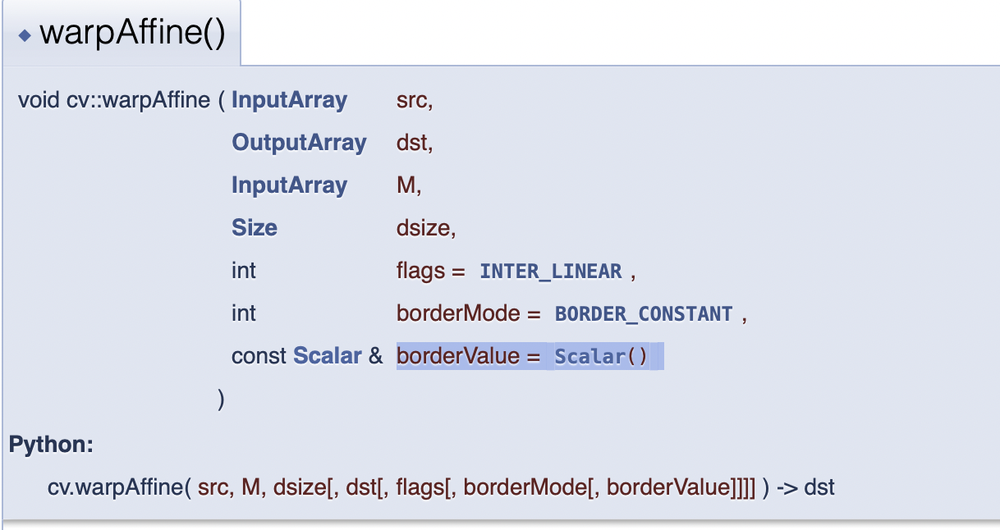

`cv2.rotate(cv2.ROTATE_90_COUNTERCLOCKWISE)
cv2.rotate(cv2.ROTATE_180)
cv2.rotate(cv2.ROTATE_90_CLOCKWISE)`  

이런 코드를 통하면 회전 시킨 스티커의 배경이 짤리지 않는다. 
그 외에는 다 짤리네... ㅠㅠ  

----
`borderMode= cv2.BORDER_TRANSPARENT` 그리고  
`borderValue = [255, 255, 255, 255]` 회전 해도 검정 배경 없앤다는 스토리가...
> 이미지를 회전 및 이동 했을 때 생기는 빈 공간을 어떤 색깔로 채울 것인가

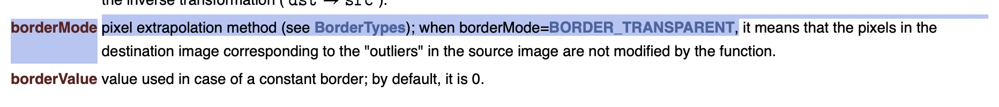

https://docs.opencv.org/4.5.3/da/d54/group__imgproc__transform.html#ga0203d9ee5fcd28d40dbc4a1ea4451983

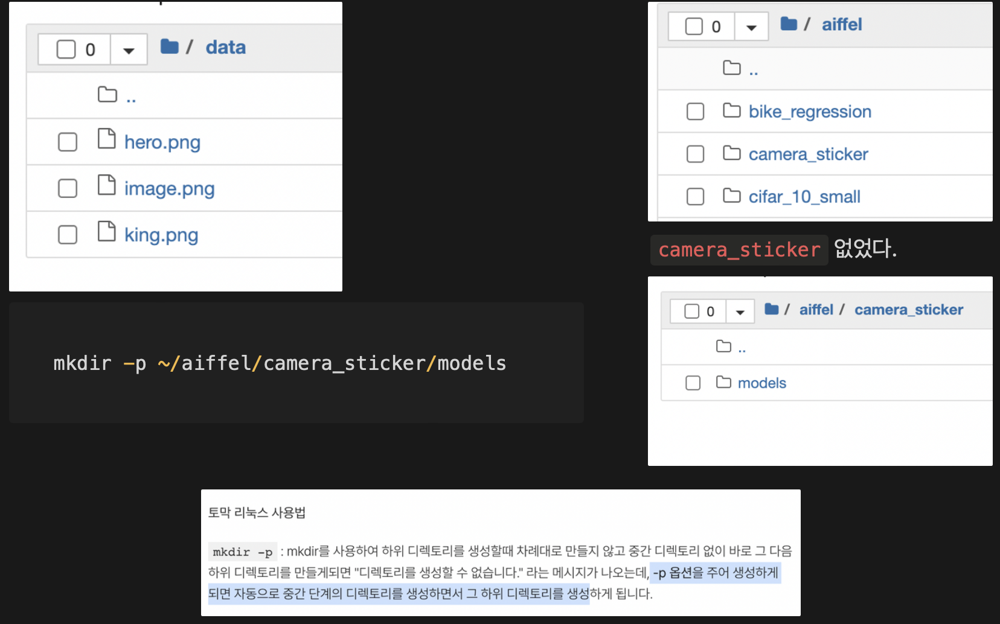

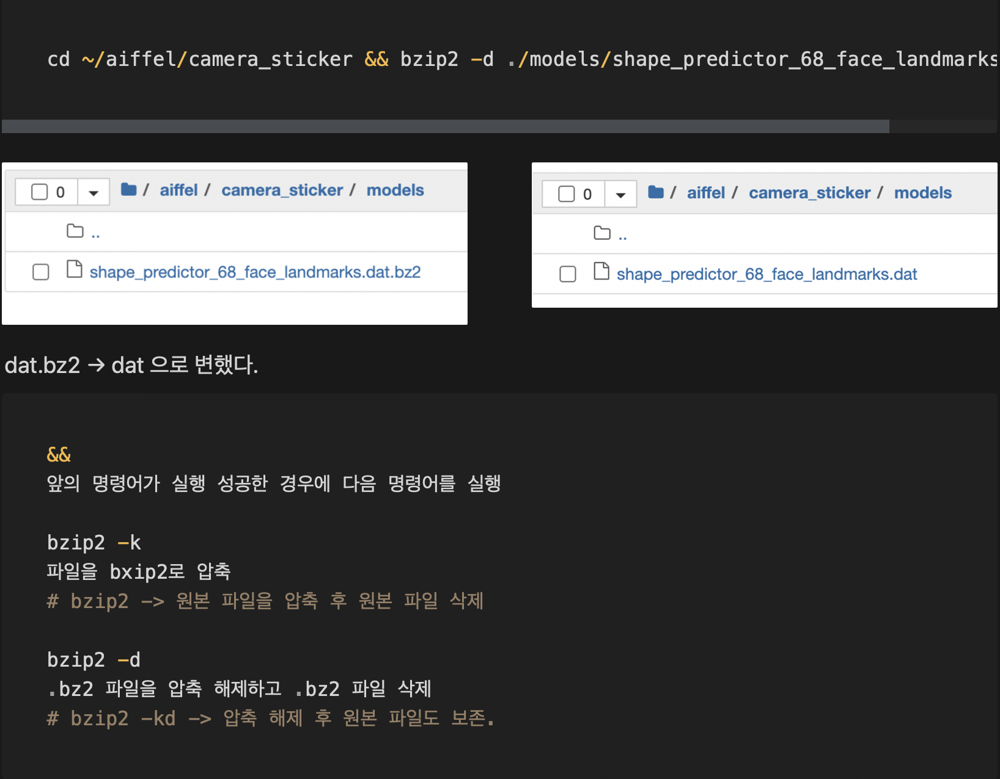

linux 용어들 거슬려서 일일이 다 찾아 비교 해봤다는 전설이....  
to be discontinued

P.S 셀카 사진 공유해주신 __`우유 빛깔 연예인, 지영님`__ 께 다시 한 번 더 감사함을 표현드리옵나이다. (꾸벅)  
이번 프로젝트 별점은 지영님께 주시면 됩니다.  